# Decision Tree - I

In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve

In [2]:
df= pd.read_csv(r"E:\ML by Sudh\Sourse File\winequality_red.csv")
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [3]:
from pandas_profiling import ProfileReport

In [4]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,1599.0,8.319637,1.741096,4.60000,7.1000,7.90000,9.200000,15.90000
volatile acidity,1599.0,0.527821,0.179060,0.12000,0.3900,0.52000,0.640000,1.58000
citric acid,1599.0,0.270976,0.194801,0.00000,0.0900,0.26000,0.420000,1.00000
residual sugar,1599.0,2.538806,1.409928,0.90000,1.9000,2.20000,2.600000,15.50000
chlorides,1599.0,0.087467,0.047065,0.01200,0.0700,0.07900,0.090000,0.61100
free sulfur dioxide,1599.0,15.874922,10.460157,1.00000,7.0000,14.00000,21.000000,72.00000
total sulfur dioxide,1599.0,46.467792,32.895324,6.00000,22.0000,38.00000,62.000000,289.00000
density,1599.0,0.996747,0.001887,0.99007,0.9956,0.99675,0.997835,1.00369
pH,1599.0,3.311113,0.154386,2.74000,3.2100,3.31000,3.400000,4.01000
sulphates,1599.0,0.658149,0.169507,0.33000,0.5500,0.62000,0.730000,2.00000


In [6]:
X= df.drop(columns= 'quality')
X.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


In [7]:
y= df['quality']
y.head()

0    5
1    5
2    5
3    6
4    5
Name: quality, dtype: int64

In [8]:
x_train , x_test, y_train,y_test = train_test_split(X,y,test_size = .25,random_state = 30)

In [9]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1178,5.6,0.915,0.00,2.1,0.041,17.0,78.0,0.99346,3.68,0.73,11.4
1189,8.8,0.955,0.05,1.8,0.075,5.0,19.0,0.99616,3.30,0.44,9.6
161,7.6,0.680,0.02,1.3,0.072,9.0,20.0,0.99650,3.17,1.08,9.2
109,8.1,0.785,0.52,2.0,0.122,37.0,153.0,0.99690,3.21,0.69,9.3
961,7.1,0.560,0.14,1.6,0.078,7.0,18.0,0.99592,3.27,0.62,9.3
...,...,...,...,...,...,...,...,...,...,...,...
919,8.4,0.620,0.12,1.8,0.072,38.0,46.0,0.99504,3.38,0.89,11.8
1164,9.0,0.785,0.24,1.7,0.078,10.0,21.0,0.99692,3.29,0.67,10.0
500,7.8,0.520,0.25,1.9,0.081,14.0,38.0,0.99840,3.43,0.65,9.0
941,9.9,0.270,0.49,5.0,0.082,9.0,17.0,0.99484,3.19,0.52,12.5


In [10]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1147,10.0,0.410,0.45,6.20,0.071,6.0,14.0,0.99702,3.21,0.49,11.8
659,7.1,0.840,0.02,4.40,0.096,5.0,13.0,0.99700,3.41,0.57,11.0
871,6.9,0.560,0.03,1.50,0.086,36.0,46.0,0.99522,3.53,0.57,10.6
1333,9.1,0.775,0.22,2.20,0.079,12.0,48.0,0.99760,3.18,0.51,9.6
1411,6.4,0.470,0.40,2.40,0.071,8.0,19.0,0.99630,3.56,0.73,10.6
...,...,...,...,...,...,...,...,...,...,...,...
721,8.9,0.480,0.24,2.85,0.094,35.0,106.0,0.99820,3.10,0.53,9.2
490,9.3,0.775,0.27,2.80,0.078,24.0,56.0,0.99840,3.31,0.67,10.6
575,12.3,0.270,0.49,3.10,0.079,28.0,46.0,0.99930,3.20,0.80,10.2
1051,8.5,0.460,0.59,1.40,0.414,16.0,45.0,0.99702,3.03,1.34,9.2


In [11]:
dt_model = DecisionTreeClassifier()

In [12]:
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [13]:
dt_model.predict(x_test)

array([6, 3, 6, 6, 6, 5, 6, 6, 5, 3, 6, 6, 6, 5, 7, 4, 5, 5, 7, 6, 5, 7,
       5, 5, 6, 5, 8, 6, 5, 5, 5, 6, 6, 6, 6, 7, 6, 6, 5, 6, 6, 6, 7, 5,
       6, 6, 6, 6, 5, 6, 6, 8, 5, 5, 5, 5, 6, 5, 5, 6, 5, 6, 7, 5, 7, 5,
       5, 6, 5, 4, 6, 5, 5, 5, 6, 6, 7, 5, 6, 5, 6, 7, 6, 6, 5, 5, 5, 5,
       5, 6, 5, 5, 6, 4, 6, 6, 4, 6, 5, 4, 5, 5, 5, 6, 6, 5, 6, 5, 6, 5,
       5, 5, 5, 7, 7, 5, 6, 6, 5, 6, 6, 7, 7, 6, 7, 5, 6, 5, 6, 6, 6, 5,
       6, 5, 6, 6, 5, 3, 7, 7, 5, 5, 6, 6, 5, 5, 5, 4, 6, 7, 5, 5, 5, 6,
       5, 6, 6, 6, 5, 5, 5, 6, 6, 5, 6, 5, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       5, 5, 6, 6, 5, 6, 7, 5, 6, 5, 6, 6, 4, 7, 5, 5, 5, 7, 6, 5, 7, 6,
       5, 8, 7, 5, 5, 5, 6, 7, 6, 6, 6, 6, 6, 5, 7, 5, 6, 5, 6, 5, 5, 6,
       6, 6, 7, 6, 5, 6, 5, 5, 7, 5, 5, 5, 7, 7, 5, 5, 5, 7, 6, 6, 5, 6,
       6, 5, 7, 6, 6, 7, 6, 5, 4, 7, 5, 6, 6, 5, 6, 6, 5, 6, 6, 5, 6, 6,
       5, 6, 6, 4, 6, 6, 5, 4, 6, 5, 5, 5, 7, 6, 5, 5, 5, 4, 5, 6, 5, 6,
       6, 5, 6, 6, 5, 6, 5, 7, 5, 6, 5, 6, 7, 6, 5,

In [14]:
dt_model.score(x_test, y_test)

0.625

In [15]:
dt_model.score(x_train, y_train)

1.0

In [16]:
dt_en= DecisionTreeClassifier(criterion="entropy")

In [17]:
dt_en.fit(x_train, y_train)

DecisionTreeClassifier(criterion='entropy')

In [18]:
dt_en.score(x_test, y_test)

0.6325

In [19]:
outfile= open("dt_en_meta.dot", "w")
tree.export_graphviz(dt_en, out_file= outfile, feature_names= X.columns)

In [20]:
dir()

['DecisionTreeClassifier',
 'GridSearchCV',
 'In',
 'Out',
 'ProfileReport',
 'X',
 '_',
 '_10',
 '_12',
 '_13',
 '_14',
 '_15',
 '_17',
 '_18',
 '_2',
 '_4',
 '_5',
 '_6',
 '_7',
 '_9',
 '__',
 '___',
 '__builtin__',
 '__builtins__',
 '__doc__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '__vsc_ipynb_file__',
 '_dh',
 '_i',
 '_i1',
 '_i10',
 '_i11',
 '_i12',
 '_i13',
 '_i14',
 '_i15',
 '_i16',
 '_i17',
 '_i18',
 '_i19',
 '_i2',
 '_i20',
 '_i3',
 '_i4',
 '_i5',
 '_i6',
 '_i7',
 '_i8',
 '_i9',
 '_ih',
 '_ii',
 '_iii',
 '_oh',
 'accuracy_score',
 'confusion_matrix',
 'df',
 'dt_en',
 'dt_model',
 'exit',
 'get_ipython',
 'np',
 'os',
 'outfile',
 'pd',
 'quit',
 'roc_auc_score',
 'roc_curve',
 'sys',
 'train_test_split',
 'tree',
 'x_test',
 'x_train',
 'y',
 'y_test',
 'y_train']

# Decision Tree Part - II

In [21]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve

In [22]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [23]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [24]:
x= df.drop(columns= 'quality')
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [25]:
y= df.quality
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [26]:
x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.25, random_state= 30)

In [27]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1178,5.6,0.915,0.00,2.1,0.041,17.0,78.0,0.99346,3.68,0.73,11.4
1189,8.8,0.955,0.05,1.8,0.075,5.0,19.0,0.99616,3.30,0.44,9.6
161,7.6,0.680,0.02,1.3,0.072,9.0,20.0,0.99650,3.17,1.08,9.2
109,8.1,0.785,0.52,2.0,0.122,37.0,153.0,0.99690,3.21,0.69,9.3
961,7.1,0.560,0.14,1.6,0.078,7.0,18.0,0.99592,3.27,0.62,9.3
...,...,...,...,...,...,...,...,...,...,...,...
919,8.4,0.620,0.12,1.8,0.072,38.0,46.0,0.99504,3.38,0.89,11.8
1164,9.0,0.785,0.24,1.7,0.078,10.0,21.0,0.99692,3.29,0.67,10.0
500,7.8,0.520,0.25,1.9,0.081,14.0,38.0,0.99840,3.43,0.65,9.0
941,9.9,0.270,0.49,5.0,0.082,9.0,17.0,0.99484,3.19,0.52,12.5


In [28]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1147,10.0,0.410,0.45,6.20,0.071,6.0,14.0,0.99702,3.21,0.49,11.8
659,7.1,0.840,0.02,4.40,0.096,5.0,13.0,0.99700,3.41,0.57,11.0
871,6.9,0.560,0.03,1.50,0.086,36.0,46.0,0.99522,3.53,0.57,10.6
1333,9.1,0.775,0.22,2.20,0.079,12.0,48.0,0.99760,3.18,0.51,9.6
1411,6.4,0.470,0.40,2.40,0.071,8.0,19.0,0.99630,3.56,0.73,10.6
...,...,...,...,...,...,...,...,...,...,...,...
721,8.9,0.480,0.24,2.85,0.094,35.0,106.0,0.99820,3.10,0.53,9.2
490,9.3,0.775,0.27,2.80,0.078,24.0,56.0,0.99840,3.31,0.67,10.6
575,12.3,0.270,0.49,3.10,0.079,28.0,46.0,0.99930,3.20,0.80,10.2
1051,8.5,0.460,0.59,1.40,0.414,16.0,45.0,0.99702,3.03,1.34,9.2


In [29]:
dt_model= DecisionTreeClassifier()

In [30]:
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [31]:
import sklearn
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

In [32]:
sklearn.__version__

'1.0.2'

[Text(0.5465270007459505, 0.9722222222222222, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(0.3195632193094629, 0.9166666666666666, 'X[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(0.20178628516624042, 0.8611111111111112, 'X[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(0.07835144927536232, 0.8055555555555556, 'X[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(0.05536018755328218, 0.75, 'X[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(0.0196078431372549, 0.6944444444444444, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(0.01278772378516624, 0.6388888888888888, 'X[9] <= 0.54\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(0.00937766410912191, 0.5833333333333334, 'X[9] <= 0.48\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0, 0, 0]'),
 Text(0.00596760443307

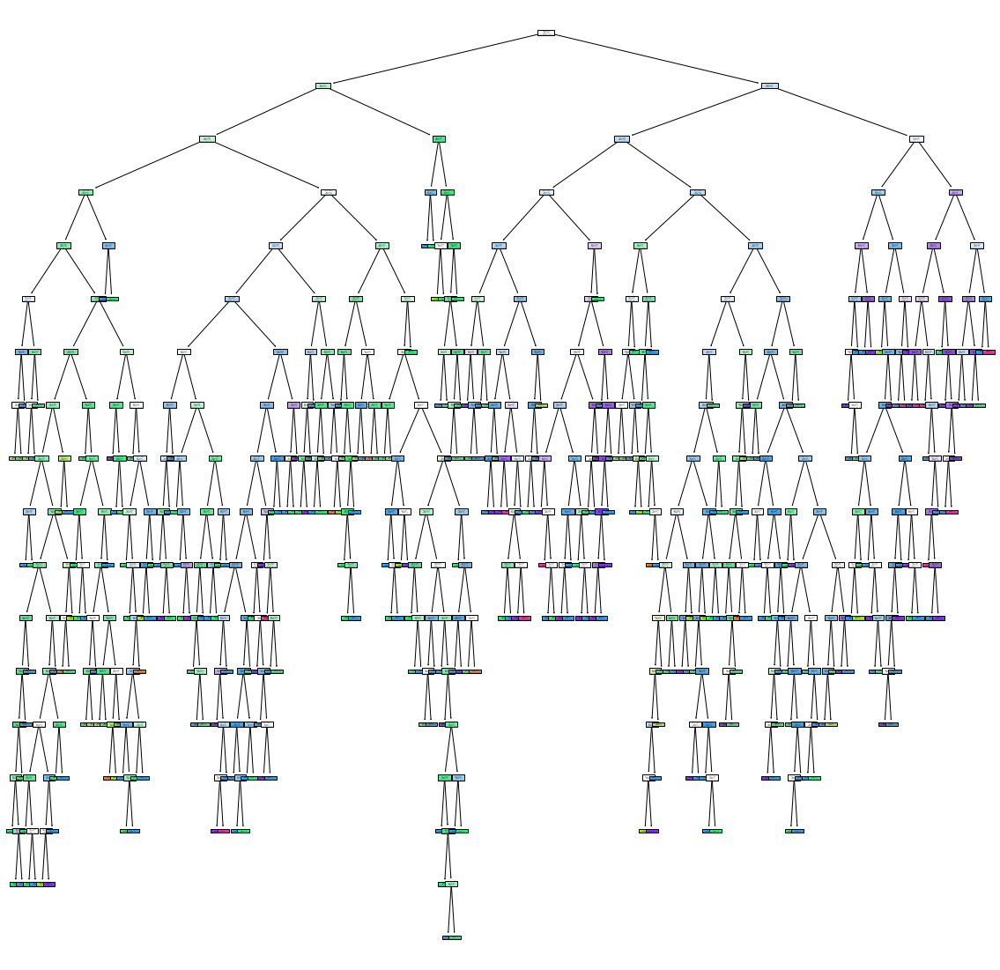

In [33]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model, filled=True)

In [34]:
df1= df.head(30)

In [35]:
x1= df1.drop(columns= 'quality')

In [36]:
y1= df1.quality

In [37]:
dt_model1= DecisionTreeClassifier()
dt_model1.fit(x1, y1)

DecisionTreeClassifier()

[Text(0.5909090909090909, 0.9166666666666666, 'X[2] <= 0.42\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]'),
 Text(0.36363636363636365, 0.75, 'X[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]'),
 Text(0.18181818181818182, 0.5833333333333334, 'X[4] <= 0.076\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]'),
 Text(0.09090909090909091, 0.4166666666666667, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]'),
 Text(0.2727272727272727, 0.4166666666666667, 'X[6] <= 13.5\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]'),
 Text(0.18181818181818182, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(0.36363636363636365, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]'),
 Text(0.5454545454545454, 0.5833333333333334, 'X[10] <= 9.05\ngini = 0.169\nsamples = 22\nvalue = [1, 20, 1, 0]'),
 Text(0.45454545454545453, 0.4166666666666667, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0]'),
 Text(0.6363636363636364, 0.4166666666666667, 'X[1] <= 0.415\ngini = 0.091\nsamples = 

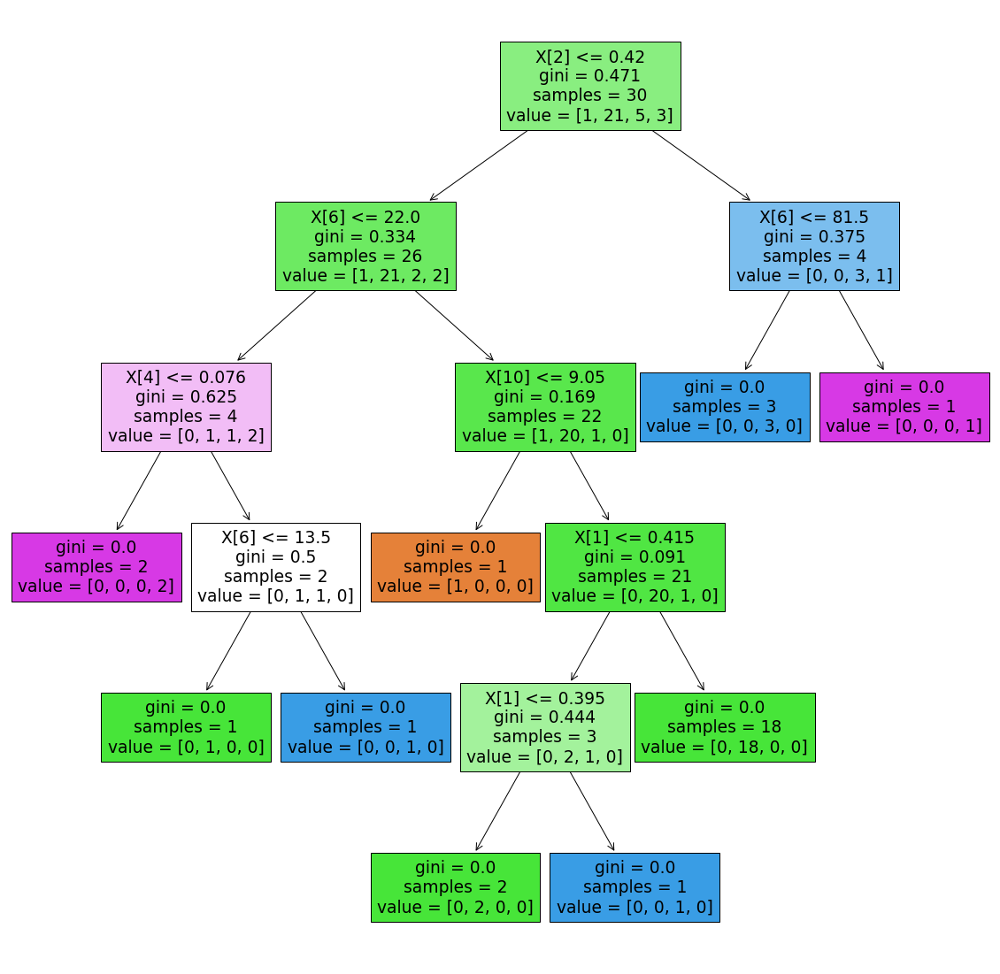

In [38]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled=True)

In [39]:
set(y1)

{4, 5, 6, 7}

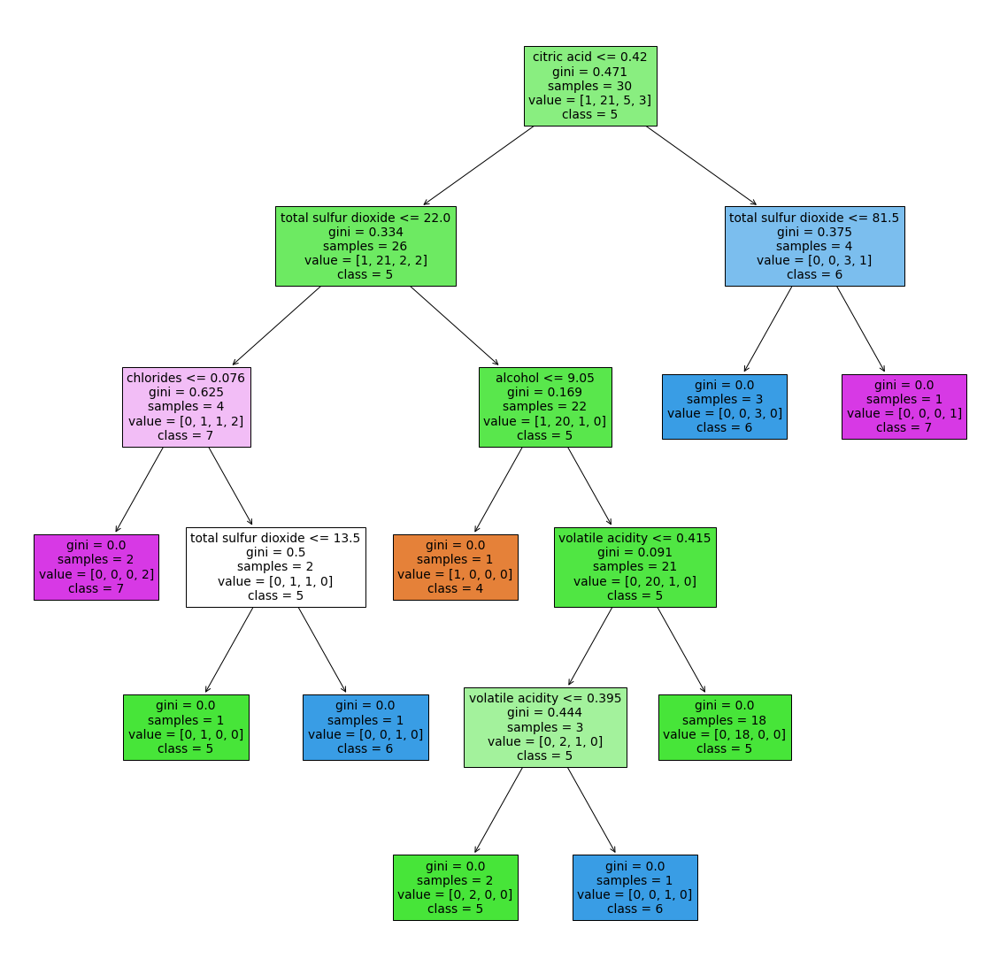

In [42]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled= True, class_names= [str(i) for i in set(y1)], feature_names= x1.columns)
plt.savefig('dt_model_1')

In [43]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6], dtype=int64)

In [44]:
dt_model1.score(x1, y1)

1.0

In [45]:
dt_model1.score(x_test, y_test)

0.465

In [46]:
path= dt_model1.cost_complexity_pruning_path(x1, y1)
path # It's the complexity of pruning

{'ccp_alphas': array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
        0.06075036, 0.08216783, 0.13136752]),
 'impurities': array([0.        , 0.06349206, 0.0968254 , 0.1468254 , 0.1968254 ,
        0.25757576, 0.33974359, 0.47111111])}

In [47]:
ccp_alpha= path.ccp_alphas

In [48]:
ccp_alpha

array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
       0.06075036, 0.08216783, 0.13136752])

In [50]:
dt_modle2 = []
for ccp in ccp_alpha:
    dt_m  = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_modle2.append(dt_m)

In [51]:
dt_modle2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.03174603174603176),
 DecisionTreeClassifier(ccp_alpha=0.03333333333333333),
 DecisionTreeClassifier(ccp_alpha=0.049999999999999996),
 DecisionTreeClassifier(ccp_alpha=0.05),
 DecisionTreeClassifier(ccp_alpha=0.06075036075036072),
 DecisionTreeClassifier(ccp_alpha=0.08216783216783222),
 DecisionTreeClassifier(ccp_alpha=0.1313675213675214)]

Text(0, 0.5, 'score')

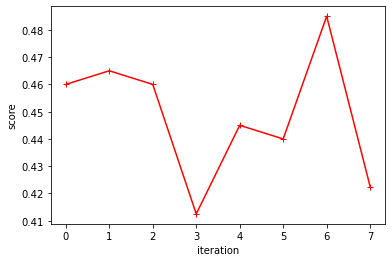

In [52]:
dt_model2 = []
score = []
for i in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha = i)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)
    score.append(dt_m.score(x_test, y_test))

    
plt.plot(score, 'r-+')
plt.xlabel('iteration')
plt.ylabel('score')

In [53]:
train_score= [i.score(x1, y1) for i in dt_modle2]

In [54]:
test_score= [i.score(x_test, y_test) for i in dt_modle2]

In [55]:
train_score

[1.0,
 0.9666666666666667,
 0.9333333333333333,
 0.9,
 0.8666666666666667,
 0.8333333333333334,
 0.8,
 0.7]

In [56]:
test_score

[0.46, 0.485, 0.45, 0.4075, 0.445, 0.445, 0.4625, 0.4225]

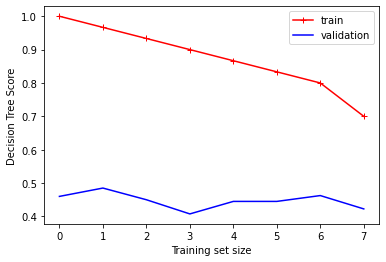

In [57]:
plt.plot(train_score, 'r-+', label= 'train')
plt.plot(test_score, 'b-', label= 'validation')
plt.xlabel("Training set size")
plt.ylabel("Decision Tree Score")
plt.legend()
plt.show()

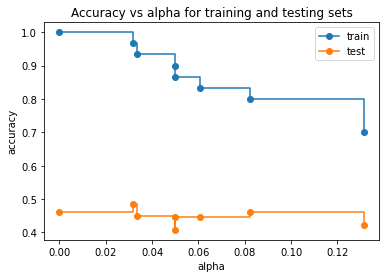

In [58]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [59]:
dt_model_ccp = DecisionTreeClassifier(random_state=0 , ccp_alpha=.014)
dt_model_ccp.fit(x1, y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(0.625, 0.9166666666666666, 'X[2] <= 0.42\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]'),
 Text(0.4166666666666667, 0.75, 'X[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]'),
 Text(0.25, 0.5833333333333334, 'X[5] <= 8.5\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]'),
 Text(0.16666666666666666, 0.4166666666666667, 'X[7] <= 0.996\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]'),
 Text(0.08333333333333333, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(0.25, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]'),
 Text(0.3333333333333333, 0.4166666666666667, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]'),
 Text(0.5833333333333334, 0.5833333333333334, 'X[5] <= 7.5\ngini = 0.169\nsamples = 22\nvalue = [1, 20, 1, 0]'),
 Text(0.5, 0.4166666666666667, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0]'),
 Text(0.6666666666666666, 0.4166666666666667, 'X[1] <= 0.415\ngini = 0.091\nsamples = 21\nvalue = [0, 20, 1, 0]'),
 Text(0.5833333333333334, 0.25, 'X

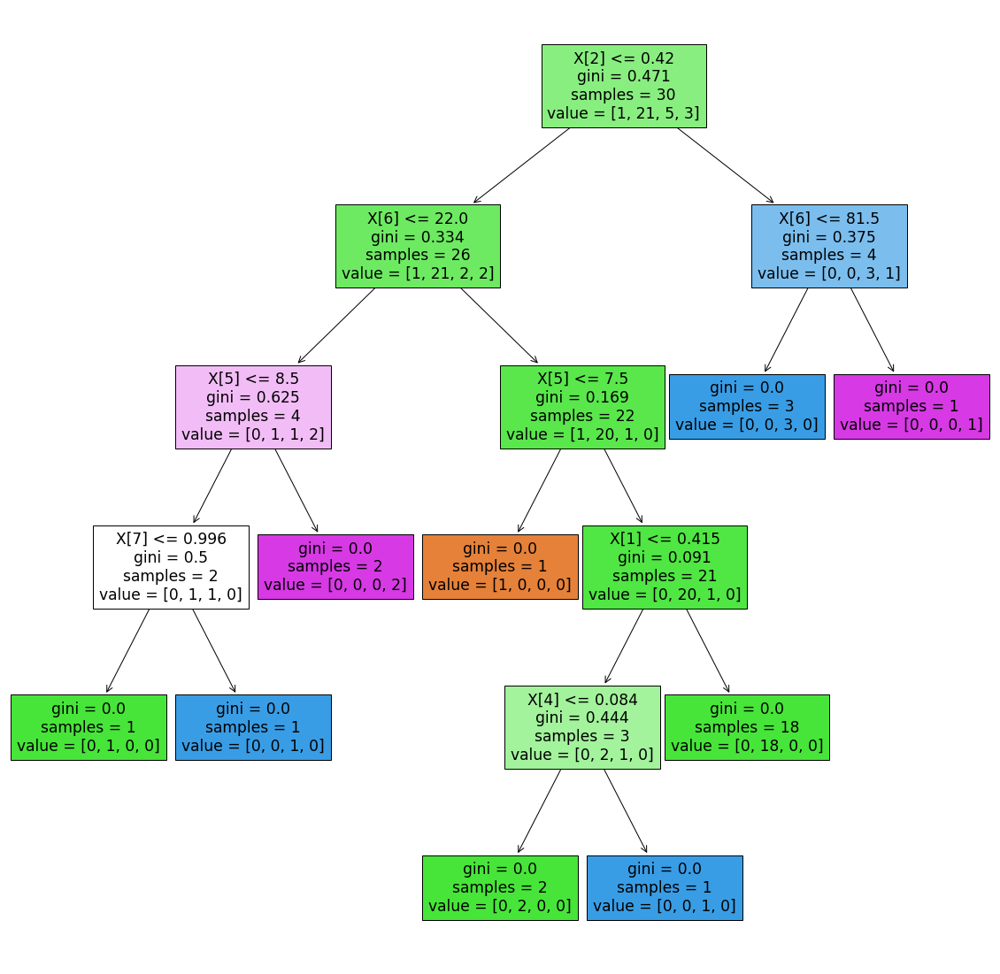

In [60]:
plt.figure(figsize=(20, 20))
tree.plot_tree(dt_model_ccp, filled=True)

In [63]:
dt_model_ccp.score(x_train, y_train)

0.40950792326939117

In [62]:
dt_model_ccp.score(x_test, y_test)

0.47

In [64]:
dt_model_ccp.score(x1, y1)

1.0

In [65]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.03174603174603176),
 DecisionTreeClassifier(ccp_alpha=0.03333333333333333),
 DecisionTreeClassifier(ccp_alpha=0.049999999999999996),
 DecisionTreeClassifier(ccp_alpha=0.05),
 DecisionTreeClassifier(ccp_alpha=0.06075036075036072),
 DecisionTreeClassifier(ccp_alpha=0.08216783216783222),
 DecisionTreeClassifier(ccp_alpha=0.1313675213675214)]

In [67]:
grid_pram = {"criterion":['gini','entropy'],
             "splitter":['best','random'],
             "max_depth" : range(2,40,1),
             "min_samples_split":range(2,10 ,1),
             "min_samples_leaf":range(1,10,1),
             'ccp_alpha':np.random.rand(20)
             }

In [68]:
grid_ccp = GridSearchCV(estimator= dt_model_ccp,
param_grid= grid_pram,
 cv= 10,
 n_jobs= -1)

```python
grid_ccp.fit(x1, y1)
grid_ccp.best_params_
```

In [72]:
dt_cpp_new = DecisionTreeClassifier(criterion='entropy', 
max_depth= 17,
min_samples_leaf= 1, 
min_samples_split= 3,
 splitter= 'random',
 ccp_alpha= 0.014)

In [75]:
dt_cpp_new.fit(x1, y1)

DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=17,
                       min_samples_split=3, splitter='random')

In [76]:
dt_cpp_new.score(x1, y1)

1.0

In [77]:
dt_cpp_new.score(x_test, y_test)

0.34

In [78]:
pred = dt_cpp_new.predict(x_train)

In [79]:
pred

array([5, 7, 7, ..., 5, 4, 5], dtype=int64)

In [80]:
confusion_matrix(y_train, pred)

array([[  0,   2,   5,   1,   0,   0],
       [  0,   3,  20,   4,   8,   0],
       [  0,  23, 288,  77, 124,   0],
       [  0,  33, 294,  86,  64,   0],
       [  0,  24,  94,  26,   9,   0],
       [  0,   2,  10,   1,   1,   0]], dtype=int64)